# Mesh-Spin-Grids als GIF pro Modell

Dieses Notebook rendert für jedes Modell eine GIF-Animation mit 5 Meshes im Grid, VTK Offscreen + FFmpeg (mit Palette für gute GIF-Qualität).

- Backend: VTK Offscreen Rendering
- Encoding: GIF (optional MP4, wenn Dateiname auf .mp4 endet)
- Pro Modell werden genau 5 Mesh-Dateien (*.stl/*.obj) verwendet

Hinweis: Passen Sie die Suchpfade/Schlüsselwörter an, falls Ihre Meshes an anderen Orten liegen.

# Mesh-Spin-Grids als GIF pro Modell

Dieses Notebook rendert für jedes Modell eine GIF-Animation mit 5 Meshes im Grid, VTK Offscreen + FFmpeg (mit Palette für gute GIF-Qualität).

- Backend: VTK Offscreen Rendering
- Encoding: GIF (optional MP4, wenn Dateiname auf .mp4 endet)
- Pro Modell werden genau 5 Mesh-Dateien (*.stl/*.obj) verwendet

Hinweis: Passen Sie die Suchpfade/Schlüsselwörter an, falls Ihre Meshes an anderen Orten liegen.

In [11]:
import os, sys, math, glob, subprocess
import numpy as np
import vtk
from vtk.util.numpy_support import vtk_to_numpy
import imageio_ffmpeg as ioff
from typing import List, Dict


def read_polydata(path: str) -> vtk.vtkPolyData:
    ext = os.path.splitext(path)[1].lower()
    if ext == ".stl":
        r = vtk.vtkSTLReader()
    elif ext == ".obj":
        r = vtk.vtkOBJReader()
    else:
        raise ValueError(f"Unsupported extension: {ext}")
    r.SetFileName(path)
    r.Update()
    # Normals für anständige Schattierung
    n = vtk.vtkPolyDataNormals()
    n.SetInputConnection(r.GetOutputPort())
    n.SplittingOff()
    n.ConsistencyOn()
    n.AutoOrientNormalsOn()
    n.Update()
    return n.GetOutput()


def make_actor(
    poly: vtk.vtkPolyData, target_diag: float = 1.0, color=(0.8, 0.8, 0.85)
) -> vtk.vtkActor:
    mapper = vtk.vtkPolyDataMapper()
    mapper.SetInputData(poly)
    mapper.ScalarVisibilityOff()
    actor = vtk.vtkActor()
    actor.SetMapper(mapper)

    # Normiertes Scaling auf Zieldiagonale
    b = poly.GetBounds()  # xmin,xmax,ymin,ymax,zmin,zmax
    dx, dy, dz = b[1] - b[0], b[3] - b[2], b[5] - b[4]
    diag = max(1e-9, math.sqrt(dx * dx + dy * dy + dz * dz))
    scale = target_diag / diag
    actor.SetScale(scale, scale, scale)

    # Rotation um das eigene Zentrum
    cx, cy, cz = (0.5 * (b[0] + b[1]), 0.5 * (b[2] + b[3]), 0.5 * (b[4] + b[5]))
    actor.SetOrigin(cx, cy, cz)

    # Material
    actor.GetProperty().SetColor(*color)
    actor.GetProperty().SetInterpolationToGouraud()
    actor.GetProperty().SetSpecular(0.1)
    actor.GetProperty().SetSpecularPower(10)
    return actor


def color_palette(i: int, n: int):
    # angenehme HSV-Rampe -> RGB
    h = (i / max(1, n)) % 1.0
    s, v = 0.25, 0.95
    import colorsys

    return colorsys.hsv_to_rgb(h, s, v)


def _add_text(
    renderer: vtk.vtkRenderer,
    text: str,
    x: int,
    y: int,
    color=(1, 1, 1),
    size: int = 18,
    h_center=True,
    v_top=False,
):
    ta = vtk.vtkTextActor()
    ta.SetInput(text)
    prop = ta.GetTextProperty()
    prop.SetColor(*color)
    prop.SetFontSize(size)
    prop.BoldOn()
    prop.ShadowOn()
    if h_center:
        prop.SetJustificationToCentered()
    else:
        prop.SetJustificationToLeft()
    if v_top:
        prop.SetVerticalJustificationToTop()
    else:
        prop.SetVerticalJustificationToCentered()
    ta.SetDisplayPosition(int(x), int(y))
    renderer.AddActor2D(ta)
    return ta


def render_spin_grid(
    files: List[str],
    out: str = "spin_grid.gif",
    cols: int | None = None,
    fps: int = 15,
    frames: int = 180,
    width: int = 960,
    height: int = 540,
    bg=(0.06, 0.07, 0.08),
    padding: float = 1.4,
    title: str | None = None,
    column_labels: List[str] | None = None,
    row_labels: List[str] | None = None,
) -> str:
    """
    Rendert eine rotierende Grid-Ansicht der gegebenen Meshes zu GIF/MP4.
    Gibt den Ausgabepfad zurück.
    Optional: Titel und Spalten-/Zeilen-Labels als 2D-Overlay.
    """
    files = [
        f
        for f in files
        if os.path.isfile(f) and os.path.splitext(f)[1].lower() in (".stl", ".obj")
    ]
    if not files:
        raise ValueError("Keine gültigen Mesh-Dateien gefunden.")

    n = len(files)
    cols = cols or math.ceil(math.sqrt(n))
    rows = math.ceil(n / cols)

    # Renderer/Window (Offscreen)
    renderer = vtk.vtkRenderer()
    renderer.SetBackground(*bg)
    renwin = vtk.vtkRenderWindow()
    renwin.OffScreenRenderingOn()
    renwin.SetSize(width, height)
    renwin.AddRenderer(renderer)
    renwin.SetMultiSamples(0)
    renwin.SetAlphaBitPlanes(0)

    # Beleuchtung
    kit = vtk.vtkLightKit()
    kit.AddLightsToRenderer(renderer)
    try:
        kit.SetKeyLightIntensity(0.9)
    except Exception:
        pass

    # Actors erstellen + layouten
    actors = []
    target_diag = 1.0
    spacing = padding * target_diag
    x0 = -(cols - 1) * spacing * 0.5
    y0 = +(rows - 1) * spacing * 0.5

    for i, path in enumerate(files):
        poly = read_polydata(path)
        c = color_palette(i, n)
        actor = make_actor(poly, target_diag=target_diag, color=c)
        r, cidx = divmod(i, cols)
        x = x0 + cidx * spacing
        y = y0 - r * spacing
        actor.SetPosition(x, y, 0.0)
        actors.append(actor)
        renderer.AddActor(actor)

    # Kamera setzen
    renderer.ResetCamera()
    cam = renderer.GetActiveCamera()
    cam.Roll(0)
    cam.SetViewUp(0, 1, 0)
    cam.Dolly(1.15)
    renderer.ResetCameraClippingRange()

    # 2D Overlays: Titel/Labels
    tile_w = width / cols
    tile_h = height / rows
    margin = 12
    if title:
        _add_text(
            renderer,
            title,
            x=width // 2,
            y=height - margin,
            color=(1, 1, 1),
            size=22,
            h_center=True,
            v_top=True,
        )
    if column_labels and len(column_labels) == cols:
        for ci, lab in enumerate(column_labels):
            cx = int((ci + 0.5) * tile_w)
            cy = height - (margin + (22 if title else 0) + 2)  # unterhalb des Titels
            _add_text(
                renderer,
                lab,
                x=cx,
                y=cy,
                color=(0.9, 0.9, 0.95),
                size=16,
                h_center=True,
                v_top=True,
            )
    if row_labels and len(row_labels) == rows:
        for ri, lab in enumerate(row_labels):
            rx = margin
            ry = int(height - (ri + 0.5) * tile_h)
            # links, mittig vertikal
            t = _add_text(
                renderer,
                lab,
                x=rx,
                y=ry,
                color=(0.85, 0.85, 0.9),
                size=14,
                h_center=False,
                v_top=False,
            )

    # W2I (RGBA)
    w2i = vtk.vtkWindowToImageFilter()
    w2i.SetInput(renwin)
    w2i.ReadFrontBufferOff()
    w2i.SetInputBufferTypeToRGBA()

    # FFmpeg vorbereiten
    ffmpeg = ioff.get_ffmpeg_exe()
    make_gif = out.lower().endswith(".gif")

    cmd = [
        ffmpeg,
        "-y",
        "-f",
        "rawvideo",
        "-vcodec",
        "rawvideo",
        "-pix_fmt",
        "rgba",
        "-s",
        f"{width}x{height}",
        "-r",
        str(fps),
        "-i",
        "-",
        "-an",
    ]

    if make_gif:
        # Hochwertige GIFs via Palette (ein-Pass split/palettegen/paletteuse)
        vf = f"fps={fps},split[s0][s1];[s0]palettegen=max_colors=256:stats_mode=diff[p];[s1][p]paletteuse=dither=sierra2_4a"
        cmd += ["-vf", vf, out]
    else:
        # MP4 mit NVENC, Fallback libx264
        enc = "h264_nvenc"
        try:
            outp = subprocess.run(
                [ffmpeg, "-hide_banner", "-encoders"], capture_output=True, text=True
            )
            if "h264_nvenc" not in outp.stdout:
                enc = "libx264"
        except Exception:
            enc = "libx264"
        cmd += [
            "-vcodec",
            enc,
            "-preset",
            "p5" if enc == "h264_nvenc" else "veryfast",
            "-pix_fmt",
            "yuv420p",
            out,
        ]

    proc = subprocess.Popen(cmd, stdin=subprocess.PIPE)

    try:
        # Prime Render
        renwin.Render()
        for fidx in range(frames):
            angle = 360.0 * fidx / frames
            for a in actors:
                a.SetOrientation(0.0, angle, 0.0)
            renwin.Render()
            w2i.Modified()
            w2i.Update()
            img = w2i.GetOutput()
            w, h = renwin.GetSize()
            arr = vtk_to_numpy(img.GetPointData().GetScalars()).reshape(h, w, 4)
            arr = np.flipud(arr)  # VTK Ursprung unten links
            proc.stdin.write(arr.tobytes())
        proc.stdin.close()
        proc.wait()
    finally:
        if proc.poll() is None:
            proc.kill()

    return out

In [2]:
def find_model_meshes(base_dir: str, keywords: list[str], limit: int = 5) -> list[str]:
    base_dir = os.path.abspath(base_dir)
    exts = ("*.stl", "*.obj")
    all_files = []
    for ext in exts:
        all_files += glob.glob(os.path.join(base_dir, "**", ext), recursive=True)
    low_keywords = [k.lower() for k in keywords]
    cand = [f for f in sorted(all_files) if any(k in f.lower() for k in low_keywords)]
    # Unique + existierend
    uniq = []
    seen = set()
    for f in cand:
        if f not in seen and os.path.isfile(f):
            uniq.append(f)
            seen.add(f)
    if len(uniq) < limit:
        raise RuntimeError(
            f"Zu wenig Meshes für {keywords}: gefunden {len(uniq)}, benötigt {limit}. Bitte Globs/Keywords anpassen."
        )
    return uniq[:limit]


# Exakte 5-Namen-Variante: nur echte Token-Gleichheit, keine Auffüllung
import re


def _normalize_token(s: str) -> str:
    s = os.path.splitext(os.path.basename(s))[0]
    s = s.lower()
    s = re.sub(r"[^a-z0-9]+", "_", s)
    s = re.sub(r"_+", "_", s).strip("_")
    return s


def _gather_files_in_roots(
    base_dir: str,
    roots: list[str] | None,
    exts=("*.stl", "*.obj"),
    excludes: list[str] | None = None,
) -> list[str]:
    base_dir = os.path.abspath(base_dir)
    excludes = excludes or []

    def is_excluded(p: str) -> bool:
        lp = p.lower().replace("/", "\\")
        return any(excl.lower().replace("/", "\\") in lp for excl in excludes)

    files: list[str] = []
    if roots:
        for root in roots:
            root_abs = root if os.path.isabs(root) else os.path.join(base_dir, root)
            for ext in exts:
                files += glob.glob(os.path.join(root_abs, "**", ext), recursive=True)
    else:
        for ext in exts:
            files += glob.glob(os.path.join(base_dir, "**", ext), recursive=True)
    files = [f for f in files if os.path.isfile(f) and not is_excluded(f)]
    return files


def find_mesh_for_model_and_name(
    base_dir: str,
    model_keywords: list[str],
    filename_token: str,
    roots: list[str] | None = None,
    excludes: list[str] | None = None,
) -> str | None:
    files = _gather_files_in_roots(
        base_dir, roots, exts=("*.stl", "*.obj"), excludes=excludes
    )
    norm_token = _normalize_token(filename_token)
    low_keywords = [k.lower() for k in model_keywords]

    # Zuerst: nur Dateien innerhalb der modell-spezifischen Keywords betrachten
    files = [p for p in files if any(k in p.lower() for k in low_keywords)]

    # 1) Exaktes Match auf normalisiertem Basename
    exact = [p for p in files if _normalize_token(p) == norm_token]
    if exact:
        return sorted(exact)[0]

    # 2) Spezialfall pixel2mesh: Dateien heißen oft z. B. "pollen_{token}_00_predict.obj"
    if any("pixel2mesh" == k for k in low_keywords) or any(
        "pixel2mesh" in k for k in low_keywords
    ):
        relaxed: list[str] = []
        for p in files:
            bn = os.path.splitext(os.path.basename(p))[0].lower()
            # Präfix "pollen_" entfernen
            if bn.startswith("pollen_"):
                bn = bn[len("pollen_") :]
            # Suffixe wie _00_predict oder _predict oder _00 entfernen
            bn = re.sub(r"_(\d+)?_predict$", "", bn)
            bn = re.sub(r"_\d+$", "", bn)
            # Normalisieren und vergleichen
            bn_norm = re.sub(r"[^a-z0-9]+", "_", bn)
            bn_norm = re.sub(r"_+", "_", bn_norm).strip("_")
            if bn_norm == norm_token:
                relaxed.append(p)
        if relaxed:
            return sorted(relaxed)[0]

    # Kein valider Treffer
    return None


def collect_model_inputs_from_names(
    base_dir: str,
    model_keyword_map: dict[str, list[str]],
    filenames: list[str],
    roots_map: dict[str, list[str]] | None = None,
    excludes: list[str] | None = None,
) -> dict[str, list[str]]:
    result: dict[str, list[str]] = {}
    for model, kws in model_keyword_map.items():
        roots = roots_map.get(model, []) if roots_map else None
        paths: list[str] = []
        missing: list[str] = []
        for name in filenames:
            p = find_mesh_for_model_and_name(
                base_dir, kws, name, roots=roots, excludes=excludes
            )
            if p is None:
                missing.append(name)
            else:
                paths.append(p)
        if missing:
            print(f"[WARN] Modell '{model}': keine exakten Treffer für: {missing}")
        result[model] = paths
    return result


def collect_model_inputs(
    base_dir: str, model_keyword_map: dict[str, list[str]], limit: int = 5
) -> dict[str, list[str]]:
    result: dict[str, list[str]] = {}
    for model, kws in model_keyword_map.items():
        try:
            result[model] = find_model_meshes(base_dir, kws, limit=limit)
        except RuntimeError as e:
            print(f"[WARN] {e}")
    return result

In [3]:
# Konfiguration
# Basisverzeichnis für die Suche (Standard: Repository-Wurzel = eine Ebene über notebooks)
BASE_DIR = os.path.abspath(os.path.join(os.getcwd(), ".."))

# Mesh-Namen definieren (genau diese 5 für alle Modelle)
filenames = [
    "17781_Common_thyme_Thymus_vulgaris_pollen_grain",
    "17803_Ox-eye_daisy_Leucanthemum_vulgare_pollen_grain",
    "21555_Hard_rush_Juncus_inflexus_pollen_grain_shrunken",
    "21188_Meadow_goats_beard_Tragopogon_pratensis_pollen_grain",
    "17878_Alder_Alnus_sp_pollen_grain_pentaporate",
]

# Schlüsselwörter pro Modell (pfadbasierte Filter)
MODEL_KEYWORDS = {
    "pix2vox": ["pix2vox"],
    "pixelnerf": ["pixelnerf", "nerf", "pollen_augmentation2"],
    "pixel2mesh": ["pixel2mesh", "pixel2mesh_augmented_2_views"],
    "hunyuan": ["hunyuan"],
}

# Suchwurzeln je Modell (engen Suchraum ein, damit keine Fremd-Dateien matchen)
MODEL_ROOTS = {
    # Bitte bei Bedarf anpassen, Pfade relativ zu BASE_DIR oder absolut
    "pix2vox": [
        os.path.join("TestEvaluationPipeline", "data", "pix2vox_aug"),
        os.path.join("TestEvaluationPipeline", "data", "pix2vox_base"),
    ],
    "pixelnerf": [
        # laut Beispielpfad
        os.path.join("TestEvaluationPipeline", "data", "pollen_augmentation2"),
    ],
    "pixel2mesh": [
        # laut Beispielpfad
        os.path.join("TestEvaluationPipeline", "data", "Pixel2Mesh_Augmented_2_Views"),
        os.path.join("Pixel2MeshPlusPlus", "reconstructions"),
        os.path.join("Pixel2MeshPlusPlus", "outputs"),
    ],
    "hunyuan": [
        os.path.join("TestEvaluationPipeline", "data", "Hunyuan3D-four-views"),
        os.path.join("Hunyuan3D-2", "outputs"),
    ],
}

# Ordner ausschließen (Build-/Objektdateien, die nichts mit Zielmeshes zu tun haben)
EXCLUDES = [
    os.path.join("custom_rasterizer", "build"),
    os.path.join("differentiable_renderer", "build"),
    os.path.join("build", "temp.win-amd64-cpython-312"),
]

OUTPUT_DIR = os.path.join(os.getcwd(), "visualizations_gifs")
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Sammle exakt diese 5 je Modell (nur exakte Token-Matches innerhalb der Modell-Roots)
MODEL_INPUTS = collect_model_inputs_from_names(
    BASE_DIR, MODEL_KEYWORDS, filenames, roots_map=MODEL_ROOTS, excludes=EXCLUDES
)
MODEL_INPUTS

{'pix2vox': ['c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pix2vox_aug\\17781_Common_thyme_Thymus_vulgaris_pollen_grain.stl',
  'c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pix2vox_aug\\17803_Ox-eye_daisy_Leucanthemum_vulgare_pollen_grain.stl',
  'c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pix2vox_aug\\21555_Hard_rush_Juncus_inflexus_pollen_grain_shrunken.stl',
  'c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pix2vox_aug\\21188_Meadow_goats_beard_Tragopogon_pratensis_pollen_grain.stl',
  'c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pix2vox_aug\\17878_Alder_Alnus_sp_pollen_grain_pentaporate.stl'],
 'pixelnerf': ['c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipeline\\data\\pollen_augmentation2\\17781_Common_thyme_Thymus_vulgaris_pollen_grain.obj',
  'c:\\Users\\super\\Documents\\Github\\sequoia\\TestEvaluationPipelin

In [4]:
# Render für jedes Modell eine GIF-Grid-Animation mit 5 Meshes
results: dict[str, str] = {}
required = 5  # entspricht len(filenames)
for model, files in MODEL_INPUTS.items():
    if len(files) < required:
        print(f"[SKIP] {model}: nur {len(files)} gefunden (benötigt {required}).")
        continue
    out_path = os.path.join(OUTPUT_DIR, f"{model}_spin_grid.gif")
    print(f"Rendering {model} → {out_path} ...")
    out_done = render_spin_grid(
        files,
        out=out_path,
        cols=None,
        fps=15,
        frames=180,
        width=960,
        height=540,
        bg=(0.06, 0.07, 0.08),
        padding=1.4,
    )
    results[model] = out_done

results

Rendering pix2vox → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pix2vox_spin_grid.gif ...
Rendering pixelnerf → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixelnerf_spin_grid.gif ...
Rendering pixel2mesh → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixel2mesh_spin_grid.gif ...
Rendering hunyuan → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\hunyuan_spin_grid.gif ...


{'pix2vox': 'c:\\Users\\super\\Documents\\Github\\sequoia\\notebooks\\visualizations_gifs\\pix2vox_spin_grid.gif',
 'pixelnerf': 'c:\\Users\\super\\Documents\\Github\\sequoia\\notebooks\\visualizations_gifs\\pixelnerf_spin_grid.gif',
 'pixel2mesh': 'c:\\Users\\super\\Documents\\Github\\sequoia\\notebooks\\visualizations_gifs\\pixel2mesh_spin_grid.gif',
 'hunyuan': 'c:\\Users\\super\\Documents\\Github\\sequoia\\notebooks\\visualizations_gifs\\hunyuan_spin_grid.gif'}

In [12]:
# Ground-Truth Dateien sammeln (gleiche 5 Tokens)
GT_ROOT = os.path.join(BASE_DIR, "data", "processed", "interim")


def find_gt_for_token(token: str) -> str | None:
    # erwartet exakten Dateinamen <token>.stl im GT_ROOT (rekursiv)
    want_norm = _normalize_token(token)
    files = glob.glob(os.path.join(GT_ROOT, "**", "*.stl"), recursive=True)
    for p in files:
        if _normalize_token(p) == want_norm:
            return p
    return None


GT_FILES = []
missing_gt = []
for name in filenames:
    p = find_gt_for_token(name)
    if p is None:
        missing_gt.append(name)
    else:
        GT_FILES.append(p)

print("GT gefunden:", len(GT_FILES), "/", len(filenames))
if missing_gt:
    print("[WARN] Fehlende GT:", missing_gt)

# Einzel-Grids mit Titel rendern (optional)
results_titled: dict[str, str] = {}
for model, files in MODEL_INPUTS.items():
    if len(files) == len(filenames):
        out_path = os.path.join(OUTPUT_DIR, f"{model}_spin_grid_titled.gif")
        print(f"Rendering {model} (titled) → {out_path} ...")
        results_titled[model] = render_spin_grid(
            files,
            out=out_path,
            cols=None,
            fps=15,
            frames=180,
            width=960,
            height=540,
            bg=(0.06, 0.07, 0.08),
            padding=1.4,
            title=model.upper(),
        )

# GT vs Modelle Matrix (Zeilen = Tokens, Spalten = [GT, Pix2Vox, PixelNeRF, Pixel2Mesh, Hunyuan])
# Reihenfolge der Modelle festlegen
MODEL_ORDER = ["GT", "pix2vox", "pixelnerf", "pixel2mesh", "hunyuan"]

# Für jede Zeile (Token) die entsprechende Datei pro Spalte sammeln
matrix_files: list[str] = []
row_labels: list[str] = []
col_labels: list[str] = [
    "Ground Truth",
    "Pix2Vox",
    "PixelNeRF",
    "Pixel2Mesh",
    "Hunyuan3D",
]

# Hilfsmap von model->token_norm->pfad
by_model_token: dict[str, dict[str, str]] = {}
for model, paths in MODEL_INPUTS.items():
    by_model_token[model] = {_normalize_token(p): p for p in paths}

for name in filenames:
    tnorm = _normalize_token(name)
    # GT zuerst
    gt = None
    for p in GT_FILES:
        if _normalize_token(p) == tnorm:
            gt = p
            break
    if gt is None:
        # wenn GT fehlt, setze Platzhalter None (wird übersprungen)
        row_missing = True
        gt = None
    row = [gt]
    for model in ["pix2vox", "pixelnerf", "pixel2mesh", "hunyuan"]:
        row.append(by_model_token.get(model, {}).get(tnorm))
    # Nur Zeilen aufnehmen, in denen mindestens GT und min. ein Modell existieren
    if row[0] is not None and any(r is not None for r in row[1:]):
        row_labels.append(name)
        # leere durch Dummy ersetzen, damit Positionen stimmen (werden später gefiltert)
        matrix_files.extend([p for p in row if p is not None])
    else:
        print(f"[WARN] Zeile übersprungen (fehlend): {name}")

# Für die Matrix muss die Grid-Formel stimmen: rows = len(row_labels), cols = len(MODEL_ORDER)
rows = len(row_labels)
cols = len(MODEL_ORDER)
if rows > 0:
    # Um die exakte Matrix zu wahren, bauen wir die Liste files in strikter Reihenfolge (row-major) mit Platzhaltern
    files_matrix: list[str] = []
    for name in row_labels:
        tnorm = _normalize_token(name)
        # GT
        gt = next((p for p in GT_FILES if _normalize_token(p) == tnorm), None)
        files_row = [gt]
        for model in ["pix2vox", "pixelnerf", "pixel2mesh", "hunyuan"]:
            files_row.append(by_model_token.get(model, {}).get(tnorm))
        # fehlende Felder mit einer existierenden Dummy-Mesh ersetzen? Nein: wir filtern sie heraus und setzen Labels trotzdem.
        # Damit die Grid-Form aufgeht, ersetzen wir fehlende durch GT (sichtbar, aber korrekt beschriftet).
        files_row = [f if f is not None else gt for f in files_row]
        files_matrix.extend(files_row)

    out_matrix = os.path.join(OUTPUT_DIR, "gt_vs_models_matrix.gif")
    print(f"Rendering Matrix → {out_matrix} ...")
    render_spin_grid(
        files_matrix,
        out=out_matrix,
        cols=cols,
        fps=15,
        frames=180,
        width=1280,
        height=960,
        bg=(0.06, 0.07, 0.08),
        padding=1.6,
        title="Ground Truth vs Models",
        column_labels=col_labels,
        row_labels=row_labels,
    )
else:
    print("[WARN] Keine vollständigen Zeilen für die Matrix vorhanden.")

GT gefunden: 5 / 5
Rendering pix2vox (titled) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pix2vox_spin_grid_titled.gif ...
Rendering pixelnerf (titled) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixelnerf_spin_grid_titled.gif ...
Rendering pixel2mesh (titled) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixel2mesh_spin_grid_titled.gif ...
Rendering hunyuan (titled) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\hunyuan_spin_grid_titled.gif ...
Rendering Matrix → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\gt_vs_models_matrix.gif ...


In [6]:
# GT-GIFs analog zu den Modellen: Grid (5x GT) + Single (17776)
import os, glob

EXTRA_GT_PATH = r"C:\Users\super\Documents\Github\sequoia\data\processed\interim\17776_Sweet_alyssum_Lobularia_maritima_pollen_grain.stl"

# Fallback: GT_ROOT und Finder, falls in dieser Session noch nicht bekannt
try:
    GT_ROOT
except NameError:
    GT_ROOT = os.path.join(BASE_DIR, "data", "processed", "interim")

try:
    _normalize_token
except NameError:
    import re
    def _normalize_token(s: str) -> str:
        s = os.path.splitext(os.path.basename(s))[0]
        s = s.lower()
        s = re.sub(r"[^a-z0-9]+", "_", s)
        s = re.sub(r"_+", "_", s).strip("_")
        return s

# GT-Liste bestimmen
GT_LIST = []
if 'GT_FILES' in globals() and isinstance(GT_FILES, list) and len(GT_FILES) > 0:
    GT_LIST = list(GT_FILES)
else:
    # aus Tokens suchen
    def _find_gt_for_token(token: str) -> str | None:
        want_norm = _normalize_token(token)
        files = glob.glob(os.path.join(GT_ROOT, "**", "*.stl"), recursive=True)
        for p in files:
            if _normalize_token(p) == want_norm:
                return p
        return None
    for name in filenames:
        p = _find_gt_for_token(name)
        if p:
            GT_LIST.append(p)

print("GT für Grid gefunden:", len(GT_LIST))

# 1) GT-Grid analog zu model_spin_grid.gif
if len(GT_LIST) == 5:
    gt_grid_out = os.path.join(OUTPUT_DIR, "gt_spin_grid.gif")
    print(f"Rendering gt → {gt_grid_out} ...")
    render_spin_grid(
        GT_LIST,
        out=gt_grid_out,
        cols=None,  # auto grid
        fps=15,
        frames=180,
        width=960,
        height=540,
        bg=(0.06, 0.07, 0.08),
        padding=1.4,
    )
else:
    print(f"[WARN] Erwartet 5 GT-Dateien, gefunden {len(GT_LIST)} – überspringe gt_spin_grid.gif")

# 2) Single-Spin für expliziten GT-Pfad 17776
if os.path.isfile(EXTRA_GT_PATH):
    single_out = os.path.join(OUTPUT_DIR, "gt_17776_spin.gif")
    print(f"Rendering gt (single) → {single_out} ...")
    render_spin_grid(
        [EXTRA_GT_PATH],
        out=single_out,
        cols=1,
        fps=15,
        frames=180,
        width=512,
        height=512,
        bg=(0.06, 0.07, 0.08),
        padding=1.2,
    )
else:
    print("[WARN] EXTRA_GT_PATH nicht gefunden:", EXTRA_GT_PATH)

GT für Grid gefunden: 5
Rendering gt → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\gt_spin_grid.gif ...
Rendering gt (single) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\gt_17776_spin.gif ...


pix2vox → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pix2vox_spin_grid.gif


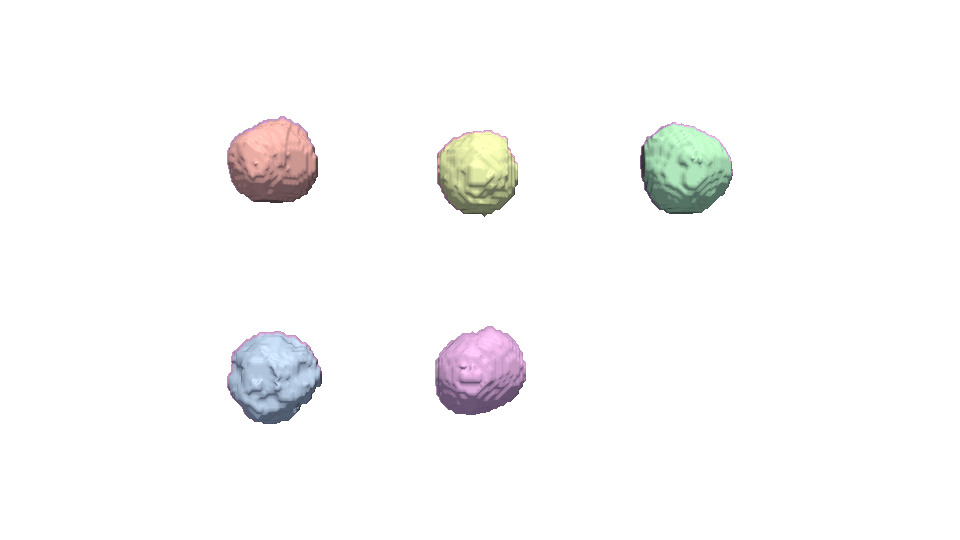

pixelnerf → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixelnerf_spin_grid.gif


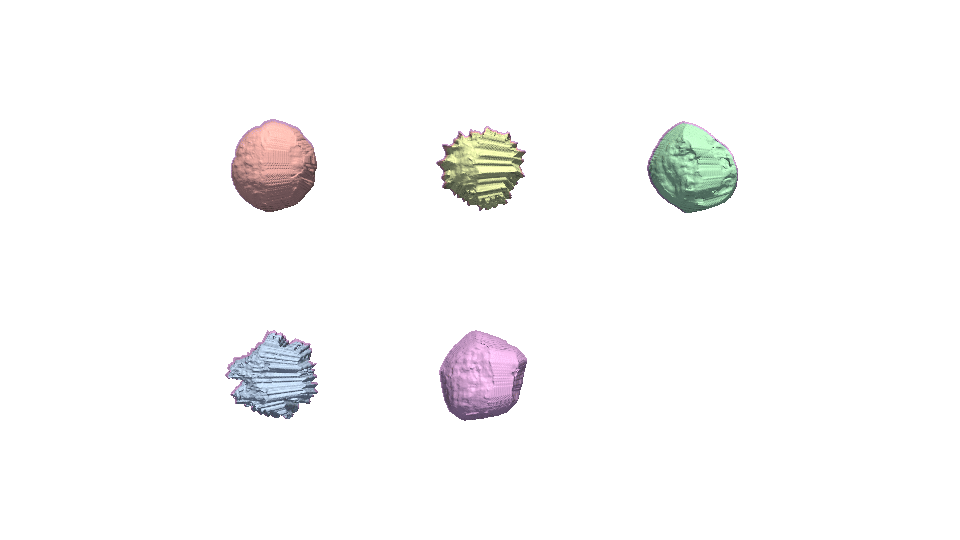

pixel2mesh → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\pixel2mesh_spin_grid.gif


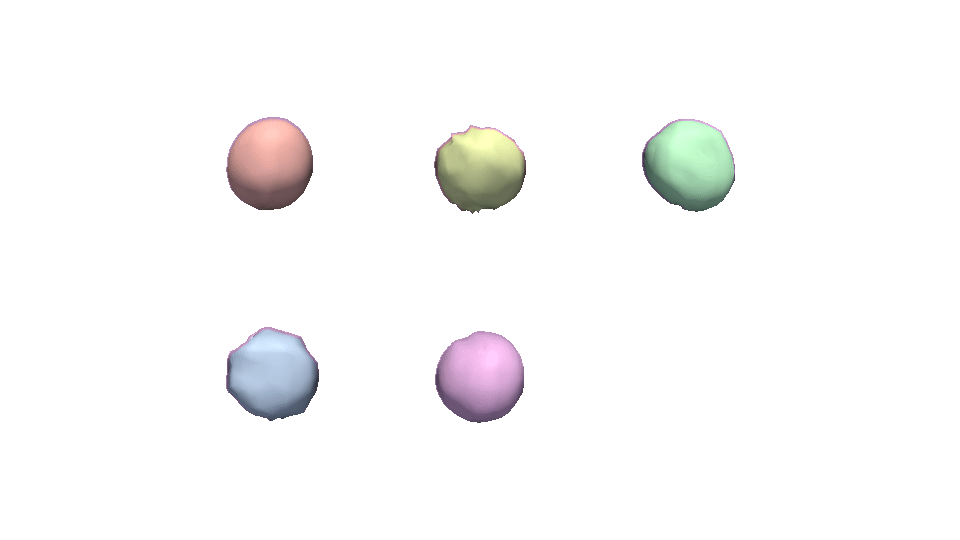

hunyuan → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\hunyuan_spin_grid.gif


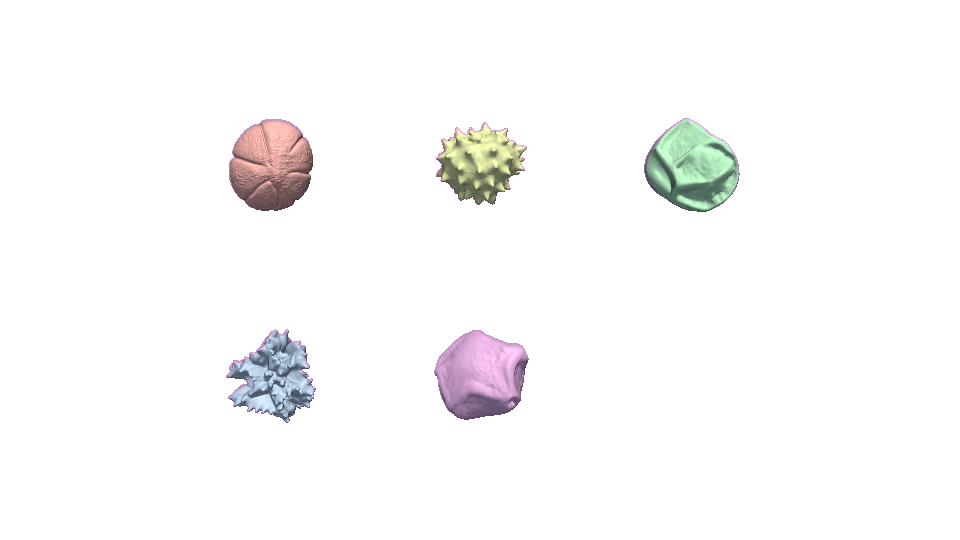

In [13]:
# Vorschau in-Notebook (GIFs inline anzeigen)
from IPython.display import Image, display

for model, path in results.items():
    print(model, "→", path)
    try:
        display(Image(filename=path))
    except Exception as e:
        print(f"Kann GIF nicht anzeigen: {e}")

In [8]:
# Diagnose: Welche Dateien werden in den Roots gefunden und wie sehen die Tokens aus?
from collections import defaultdict


def _list_in(root_rel: str):
    root_abs = root_rel if os.path.isabs(root_rel) else os.path.join(BASE_DIR, root_rel)
    files = []
    for ext in ("*.stl", "*.obj"):
        files += glob.glob(os.path.join(root_abs, "**", ext), recursive=True)
    return sorted(files)


print("BASE_DIR:", BASE_DIR)
print("pixelnerf ROOTS:", MODEL_ROOTS.get("pixelnerf"))
print("pixel2mesh ROOTS:", MODEL_ROOTS.get("pixel2mesh"))

for model in ("pixelnerf", "pixel2mesh"):
    print("\n==>", model)
    roots = MODEL_ROOTS.get(model, [])
    kws = [k.lower() for k in MODEL_KEYWORDS.get(model, [])]
    all_files = []
    for r in roots:
        all_files += _list_in(r)
    print(f"Gefunden in Roots ({len(all_files)} Dateien):")
    for p in all_files[:20]:
        print(" -", p)
    # Filter by keywords (wie in find_mesh_for_model_and_name)
    filt = [p for p in all_files if any(k in p.lower() for k in kws)]
    print(f"Nach Keyword-Filter ({len(filt)}):")
    for p in filt[:20]:
        print(" *", p)
    # Token-Probe
    want = [_normalize_token(n) for n in filenames]
    print("Ziel-Tokens:", want)
    hits = defaultdict(list)
    for p in filt:
        t = _normalize_token(p)
        if t in want:
            hits[t].append(p)
    print("Exakte Basename-Treffer pro Token:")
    for t in want:
        print("  ", t, "->", len(hits[t]))

BASE_DIR: c:\Users\super\Documents\Github\sequoia
pixelnerf ROOTS: ['TestEvaluationPipeline\\data\\pollen_augmentation2']
pixel2mesh ROOTS: ['TestEvaluationPipeline\\data\\Pixel2Mesh_Augmented_2_Views', 'Pixel2MeshPlusPlus\\reconstructions', 'Pixel2MeshPlusPlus\\outputs']

==> pixelnerf
Gefunden in Roots (32 Dateien):
 - c:\Users\super\Documents\Github\sequoia\TestEvaluationPipeline\data\pollen_augmentation2\17781_Common_thyme_Thymus_vulgaris_pollen_grain.obj
 - c:\Users\super\Documents\Github\sequoia\TestEvaluationPipeline\data\pollen_augmentation2\17782_Golden-ray_lily_Lilium_auratum_pollen_grain.obj
 - c:\Users\super\Documents\Github\sequoia\TestEvaluationPipeline\data\pollen_augmentation2\17783_Ribwort_plantain_Plantago_lanceolata_pollen_grain.obj
 - c:\Users\super\Documents\Github\sequoia\TestEvaluationPipeline\data\pollen_augmentation2\17798_Tomato_Solanum_lycopersicum_pollen_grain.obj
 - c:\Users\super\Documents\Github\sequoia\TestEvaluationPipeline\data\pollen_augmentation2\177

In [9]:
# Kompakte Zusammenfassung: Trefferanzahlen und fehlende Tokens
want = [_normalize_token(n) for n in filenames]
for model, files in MODEL_INPUTS.items():
    got = len(files)
    have_tokens = {_normalize_token(p) for p in files}
    missing = [t for t in want if t not in have_tokens]
    print(f"{model}: {got}/5 Treffer; fehlend: {missing if missing else '-'}")

pix2vox: 5/5 Treffer; fehlend: -
pixelnerf: 5/5 Treffer; fehlend: -
pixel2mesh: 5/5 Treffer; fehlend: ['17781_common_thyme_thymus_vulgaris_pollen_grain', '17803_ox_eye_daisy_leucanthemum_vulgare_pollen_grain', '21555_hard_rush_juncus_inflexus_pollen_grain_shrunken', '21188_meadow_goats_beard_tragopogon_pratensis_pollen_grain', '17878_alder_alnus_sp_pollen_grain_pentaporate']
hunyuan: 5/5 Treffer; fehlend: -


In [10]:
# Self-contained GT rendering: gt_spin_grid.gif (5 GTs) + gt_17776_spin.gif (single)
import os, sys, math, glob, subprocess
import numpy as np

try:
    import vtk
    from vtk.util.numpy_support import vtk_to_numpy
except Exception as e:
    raise RuntimeError("VTK benötigt. Bitte 'pip install vtk' ausführen.")

try:
    import imageio_ffmpeg as ioff
except Exception:
    import importlib
    ioff = importlib.import_module('imageio_ffmpeg')

# Minimal helpers (copied subset to be independent)

def read_polydata(path: str):
    ext = os.path.splitext(path)[1].lower()
    if ext == ".stl":
        r = vtk.vtkSTLReader()
    elif ext == ".obj":
        r = vtk.vtkOBJReader()
    else:
        raise ValueError(f"Unsupported extension: {ext}")
    r.SetFileName(path)
    r.Update()
    n = vtk.vtkPolyDataNormals()
    n.SetInputConnection(r.GetOutputPort())
    n.SplittingOff()
    n.ConsistencyOn()
    n.AutoOrientNormalsOn()
    n.Update()
    return n.GetOutput()


def make_actor(poly, target_diag: float = 1.0, color=(0.8, 0.8, 0.85)):
    mapper = vtk.vtkPolyDataMapper()
    mapper.SetInputData(poly)
    mapper.ScalarVisibilityOff()
    actor = vtk.vtkActor()
    actor.SetMapper(mapper)
    b = poly.GetBounds()
    dx, dy, dz = b[1]-b[0], b[3]-b[2], b[5]-b[4]
    diag = max(1e-9, math.sqrt(dx*dx + dy*dy + dz*dz))
    scale = target_diag / diag
    actor.SetScale(scale, scale, scale)
    cx, cy, cz = (0.5*(b[0]+b[1]), 0.5*(b[2]+b[3]), 0.5*(b[4]+b[5]))
    actor.SetOrigin(cx, cy, cz)
    actor.GetProperty().SetColor(*color)
    actor.GetProperty().SetInterpolationToGouraud()
    actor.GetProperty().SetSpecular(0.1)
    actor.GetProperty().SetSpecularPower(10)
    return actor


def color_palette(i: int, n: int):
    import colorsys
    h = (i / max(1, n)) % 1.0
    s, v = 0.25, 0.95
    return colorsys.hsv_to_rgb(h, s, v)


def render_spin_grid(files, out, cols=None, fps=15, frames=180, width=960, height=540, bg=(0.06,0.07,0.08), padding=1.4, title=None):
    files = [f for f in files if os.path.isfile(f) and os.path.splitext(f)[1].lower() in ('.stl', '.obj')]
    if not files:
        raise ValueError("Keine gültigen Mesh-Dateien gefunden.")
    n = len(files)
    cols = cols or math.ceil(math.sqrt(n))
    rows = math.ceil(n/cols)
    renderer = vtk.vtkRenderer()
    renderer.SetBackground(*bg)
    renwin = vtk.vtkRenderWindow()
    renwin.OffScreenRenderingOn()
    renwin.SetSize(width, height)
    renwin.AddRenderer(renderer)
    renwin.SetMultiSamples(0)
    renwin.SetAlphaBitPlanes(0)
    kit = vtk.vtkLightKit()
    kit.AddLightsToRenderer(renderer)
    try:
        kit.SetKeyLightIntensity(0.9)
    except Exception:
        pass
    actors = []
    target_diag = 1.0
    spacing = padding * target_diag
    x0 = -(cols-1)*spacing*0.5
    y0 = +(rows-1)*spacing*0.5
    for i, path in enumerate(files):
        poly = read_polydata(path)
        c = color_palette(i, n)
        actor = make_actor(poly, target_diag=target_diag, color=c)
        r, cidx = divmod(i, cols)
        x = x0 + cidx*spacing
        y = y0 - r*spacing
        actor.SetPosition(x, y, 0.0)
        actors.append(actor)
        renderer.AddActor(actor)
    renderer.ResetCamera()
    cam = renderer.GetActiveCamera()
    cam.Roll(0)
    cam.SetViewUp(0, 1, 0)
    cam.Dolly(1.15)
    renderer.ResetCameraClippingRange()
    if title:
        ta = vtk.vtkTextActor()
        ta.SetInput(title)
        prop = ta.GetTextProperty()
        prop.SetColor(1,1,1)
        prop.SetFontSize(22)
        prop.BoldOn()
        prop.ShadowOn()
        prop.SetJustificationToCentered()
        prop.SetVerticalJustificationToTop()
        ta.SetDisplayPosition(width//2, height-12)
        renderer.AddActor2D(ta)
    w2i = vtk.vtkWindowToImageFilter()
    w2i.SetInput(renwin)
    w2i.ReadFrontBufferOff()
    w2i.SetInputBufferTypeToRGBA()
    ffmpeg = ioff.get_ffmpeg_exe()
    make_gif = out.lower().endswith('.gif')
    cmd = [ffmpeg, '-y', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-pix_fmt', 'rgba', '-s', f'{width}x{height}', '-r', str(fps), '-i', '-', '-an']
    if make_gif:
        vf = f"fps={fps},split[s0][s1];[s0]palettegen=max_colors=256:stats_mode=diff[p];[s1][p]paletteuse=dither=sierra2_4a"
        cmd += ['-vf', vf, out]
    else:
        enc = 'libx264'
        cmd += ['-vcodec', enc, '-preset', 'veryfast', '-pix_fmt', 'yuv420p', out]
    proc = subprocess.Popen(cmd, stdin=subprocess.PIPE)
    try:
        renwin.Render()
        for fidx in range(frames):
            angle = 360.0 * fidx / frames
            for a in actors:
                a.SetOrientation(0.0, angle, 0.0)
            renwin.Render()
            w2i.Modified(); w2i.Update()
            img = w2i.GetOutput()
            w, h = renwin.GetSize()
            arr = vtk_to_numpy(img.GetPointData().GetScalars()).reshape(h, w, 4)
            arr = np.flipud(arr)
            proc.stdin.write(arr.tobytes())
        proc.stdin.close(); proc.wait()
    finally:
        if proc.poll() is None:
            proc.kill()
    return out

# Inputs
OUTPUT_DIR = os.path.join(os.getcwd(), 'visualizations_gifs')
os.makedirs(OUTPUT_DIR, exist_ok=True)
GT_ROOT = os.path.join(os.path.dirname(os.getcwd()), 'data', 'processed', 'interim')
filenames = [
    "17781_Common_thyme_Thymus_vulgaris_pollen_grain",
    "17803_Ox-eye_daisy_Leucanthemum_vulgare_pollen_grain",
    "21555_Hard_rush_Juncus_inflexus_pollen_grain_shrunken",
    "21188_Meadow_goats_beard_Tragopogon_pratensis_pollen_grain",
    "17878_Alder_Alnus_sp_pollen_grain_pentaporate",
]
import re

def _normalize_token(s: str) -> str:
    s = os.path.splitext(os.path.basename(s))[0]
    s = s.lower(); s = re.sub(r"[^a-z0-9]+", "_", s); s = re.sub(r"_+", "_", s).strip("_")
    return s

# Find GTs for the five tokens
GT_LIST = []
all_gt = glob.glob(os.path.join(GT_ROOT, '**', '*.stl'), recursive=True)
want = [_normalize_token(n) for n in filenames]
for t in want:
    hit = None
    for p in all_gt:
        if _normalize_token(p) == t:
            hit = p; break
    if hit:
        GT_LIST.append(hit)

print("GT für Grid gefunden:", len(GT_LIST), "/", len(filenames))

# Render gt grid
if len(GT_LIST) == 5:
    gt_grid_out = os.path.join(OUTPUT_DIR, 'gt_spin_grid.gif')
    print('Rendering gt →', gt_grid_out, '...')
    render_spin_grid(GT_LIST, out=gt_grid_out, cols=None, fps=15, frames=180, width=960, height=540, bg=(0.06,0.07,0.08), padding=1.4)
else:
    print(f"[WARN] Erwartet 5 GT-Dateien, gefunden {len(GT_LIST)} – überspringe gt_spin_grid.gif")

# Single spin for explicit GT
EXTRA_GT_PATH = r"C:\\Users\\super\\Documents\\Github\\sequoia\\data\\processed\\interim\\17776_Sweet_alyssum_Lobularia_maritima_pollen_grain.stl"
if os.path.isfile(EXTRA_GT_PATH):
    single_out = os.path.join(OUTPUT_DIR, 'gt_17776_spin.gif')
    print('Rendering gt (single) →', single_out, '...')
    render_spin_grid([EXTRA_GT_PATH], out=single_out, cols=1, fps=15, frames=180, width=512, height=512, bg=(0.06,0.07,0.08), padding=1.2)
else:
    print('[WARN] EXTRA_GT_PATH nicht gefunden:', EXTRA_GT_PATH)

print('[DONE] GT-GIFs erzeugt (falls Inputs vorhanden).')

GT für Grid gefunden: 5 / 5
Rendering gt → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\gt_spin_grid.gif ...
Rendering gt (single) → c:\Users\super\Documents\Github\sequoia\notebooks\visualizations_gifs\gt_17776_spin.gif ...
[DONE] GT-GIFs erzeugt (falls Inputs vorhanden).
